# DM-24253: Generate stack produced calibration products for HiTS

I built biases and flats for three overlapping fields in HiTS2014 and HiTS2015 and used them to run single frame processing. I then made good seeing deep comparewarp coadds with the HiTS2014 data. Finally, I ran the AP Pipeline, treating the HiTS2015 images as science and the HiTS2015 coadds as templates.

I used "Gen2" middleware to perform the following steps:

#### HiTS2014 & HiTS2015
* Ingest raw calibs (bias and flat frames) in `/project/mrawls/hits201*`
* Construct and ingest master calibs in `/project/mrawls/hits201*/calib_construction` and `/project/mrawls/hits201*/calib_scipipe`, respectively
    * Logs are in `/project/mrawls/hits201*/slurm_calib`

#### HiTS2014
* Run single frame processing with `singleFrameDriver.py` with results in `/project/mrawls/hits2014/rerun/2020_11`
    * Logs are in `/project/mrawls/hits2014/2020-11.log` (most visits) and `2020-11-part2.log` (a few visits I accidentally deleted when fixing flat ingestion)
* Make a skymap with `makeDiscreteSkyMap.py`
* Build warps with `select.nImagesMax=1000 select.maxPsfFwhm=1.4` and the `makeCoaddTempExp_goodSeeing.py` config available in `ap_pipe`
    * Logs are in `/project/mrawls/hits2014/slurm/job-3208*.out
* Assemble coadds with compareWarp to `/project/mrawls/hits2014/rerun/2020_11_coadds`
    * Logs are in `/project/mrawls/hits2014/slurm/job-3238*.out`

#### HiTS2015
* run `ap_pipe.py` with results in `/project/mrawls/hits2015/rerun/cw_2020_11`; the sqlite APDB is called `association.db` and lives in this same directory
    * Logs are in `/project/mrawls/hits2015/slurm/ap_pipe3255*.out`

The results show a small change (4% fewer DIA Sources) compared to an AP Pipeline run done using the same data but processed with DECam Community Pipeline calibrations. I plan to adopt the new calibs as well as the new templates for the ap_verify datasets in [DM-27659](https://jira.lsstcorp.org/browse/DM-27659).

In [76]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd
#import psycopg2

from astropy.coordinates import SkyCoord
import astropy.units as u

import lsst.daf.persistence as dafPersist
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig

In [72]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla
import plotLightcurve as plc

In [87]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)
importlib.reload(plc)

<module 'plotLightcurve' from '/project/mrawls/ap_pipe-notebooks/plotLightcurve.py'>

In [3]:
repo = '/project/mrawls/hits2015/rerun/cw_2020_11'

In [4]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo)

## The standard plots of DIA Objects and DIA Sources

<IPython.core.display.Javascript object>


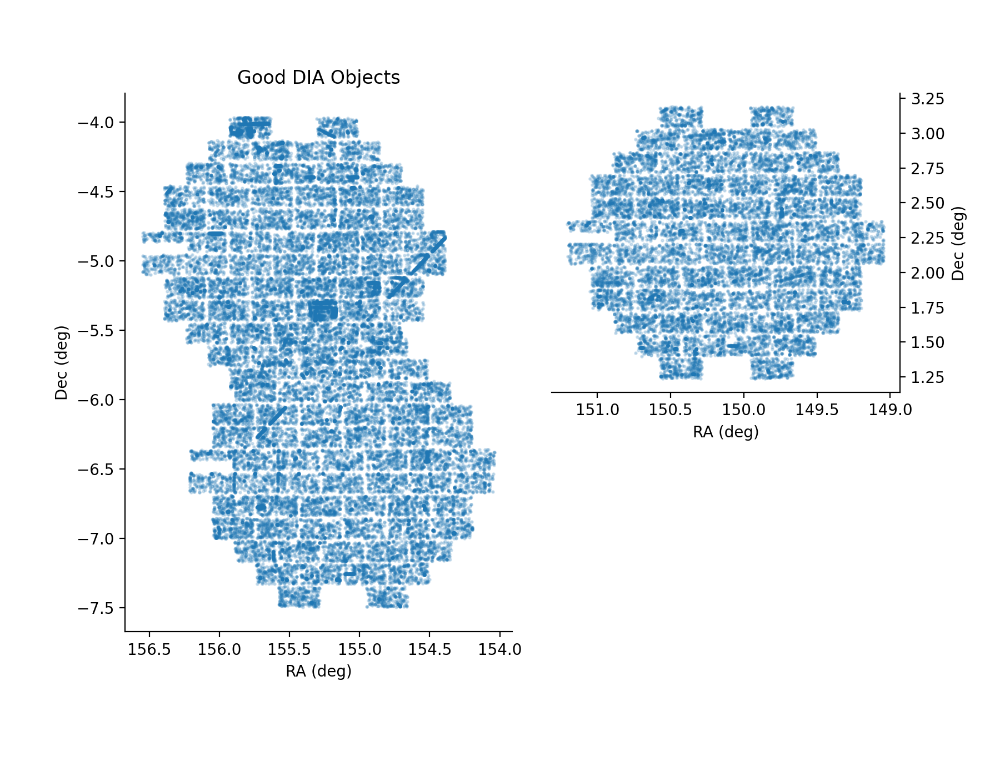

In [5]:
hitsPlot = pla.plotHitsSourcesOnSky(goodObj, title='Good DIA Objects')

<IPython.core.display.Javascript object>


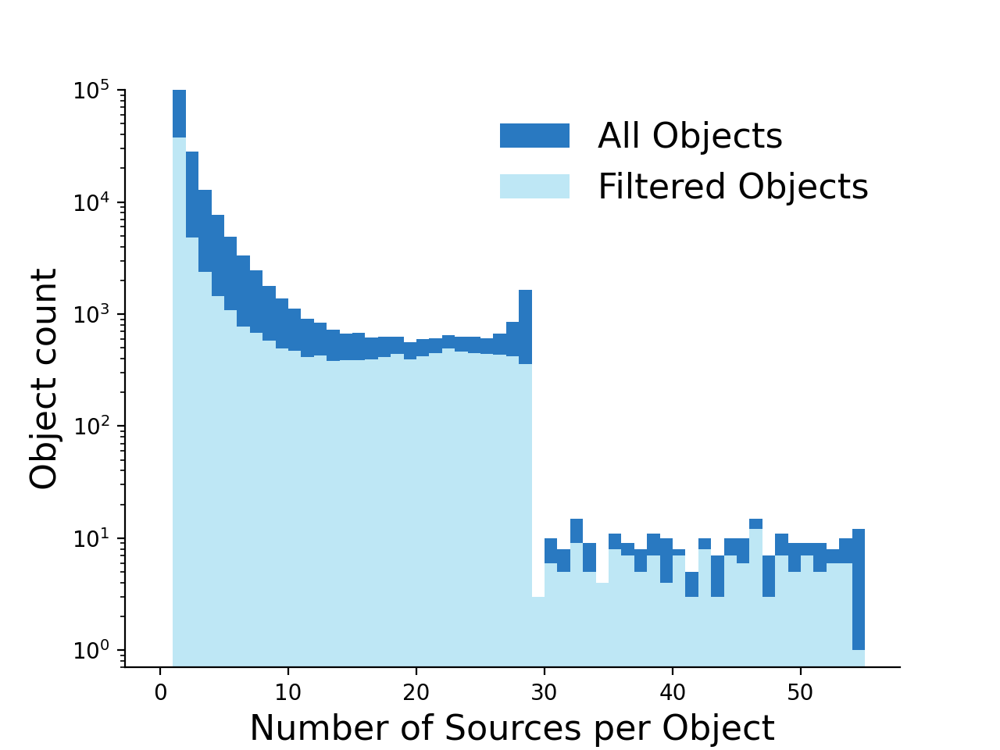

In [6]:
hist = doa.plotDiaObjectHistogram(objTable, goodObj)

<IPython.core.display.Javascript object>


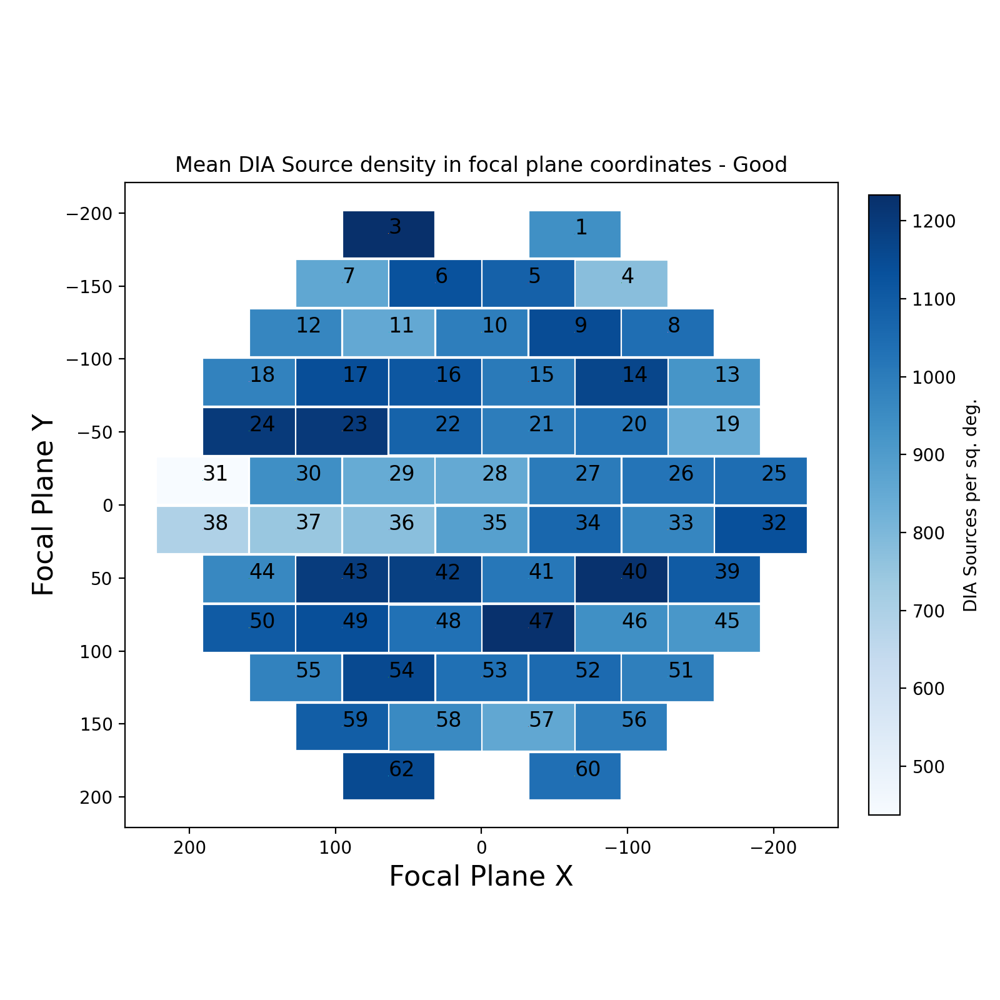

In [7]:
pla.plotDiaSourceDensityInFocalPlane(repo, goodSrc, title='- Good')

<IPython.core.display.Javascript object>


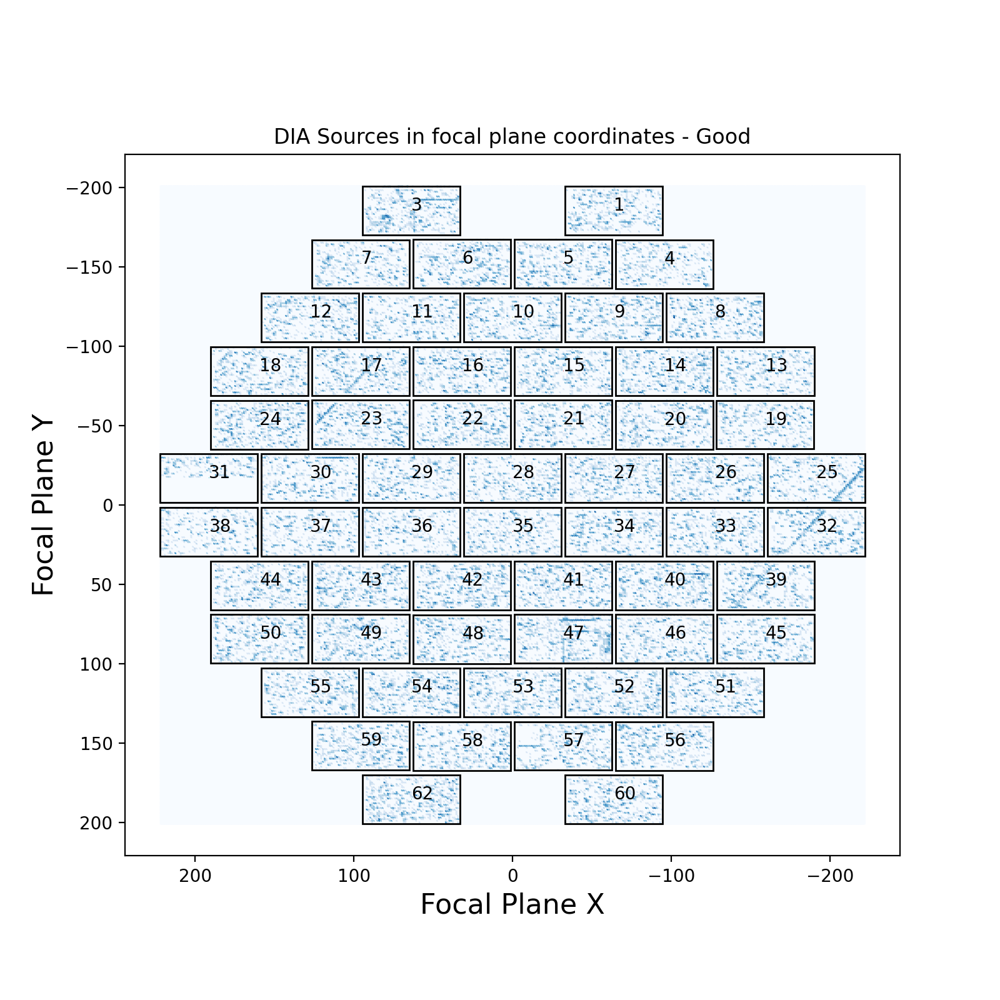

In [8]:
pla.plotDiaSourcesInFocalPlane(repo, goodSrc, title='- Good')

<IPython.core.display.Javascript object>


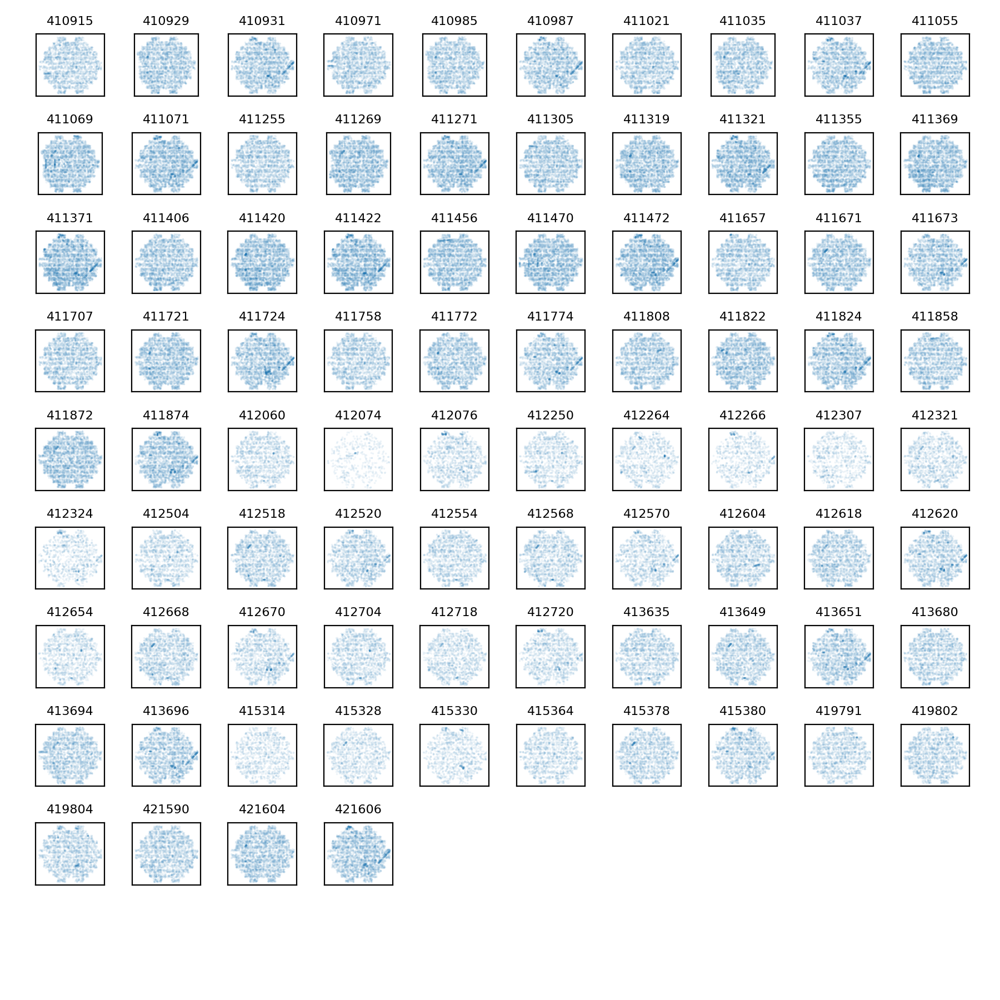

In [9]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc)

## Difference image flux (`psFlux`) and calexp flux (`totFlux`) distributions

In [10]:
def plotFluxHistSrc(srcTable1, srcTable2=None, fluxType='psFlux', label1=None, label2=None, title=None, ylog=False):
    plt.figure(figsize=(7, 5))
    plt.xlabel(fluxType, size=12)
    plt.ylabel('DIA Source count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-1e4, 1e4, 200)
    if ylog:
        plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1[fluxType].values, bins=bins, color='#2979C1', label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2[fluxType].values, bins=bins, color='#Bee7F5', label=label2)
    if label1:
        plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


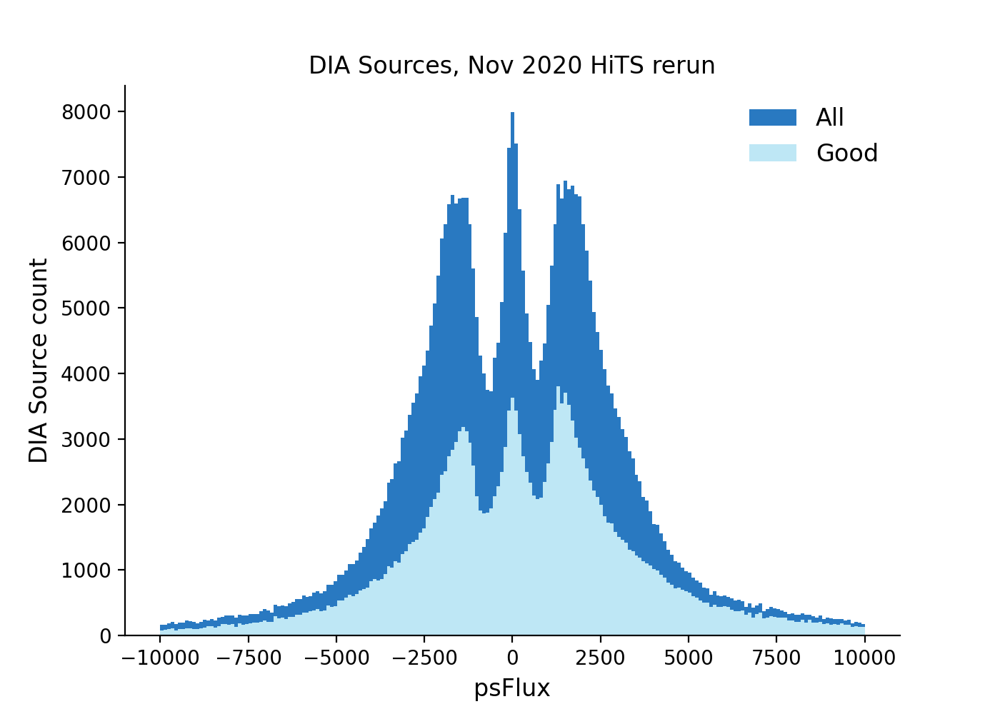

In [11]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title='DIA Sources, Nov 2020 HiTS rerun')

<IPython.core.display.Javascript object>


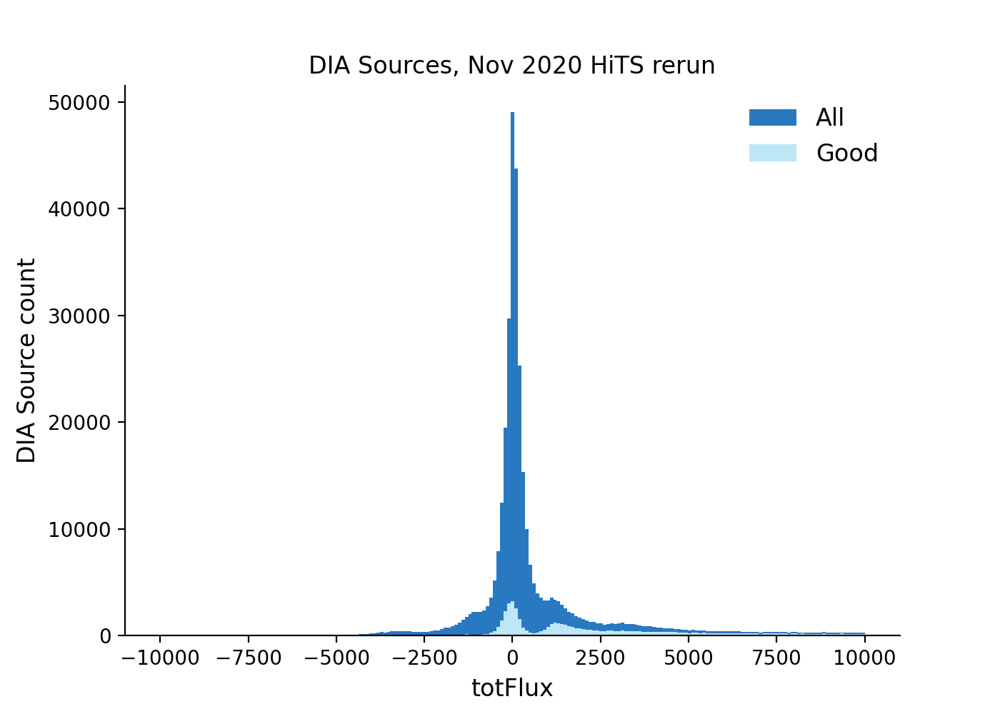

In [12]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title='DIA Sources, Nov 2020 HiTS rerun')

## Comparing to previous rerun with community pipeline calibs

In [13]:
repo_old = '/project/mrawls/hits2015/rerun/cw_2020_08'

In [14]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = pla.loadTables(repo_old)

In [15]:
print(len(srcTable), len(srcTable_old))
print(len(goodSrc), len(goodSrc_old))
print(len(objTable), len(objTable_old))
print(len(goodObj), len(goodObj_old))

647018 671170
226858 229290
225889 247550
57795 59351


<IPython.core.display.Javascript object>


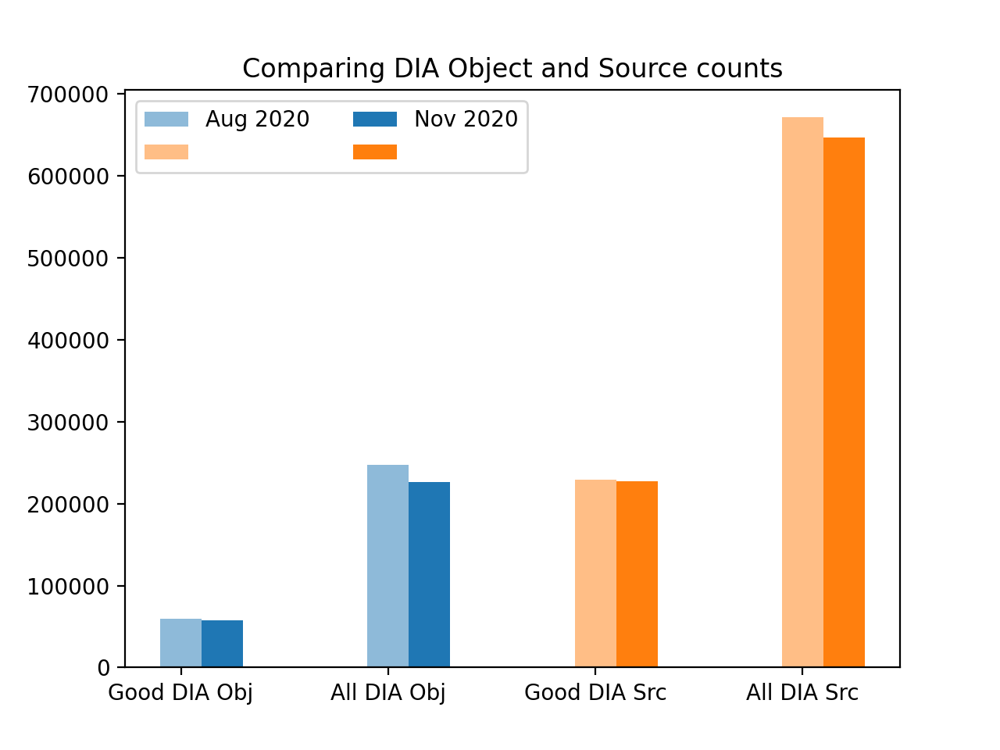

Text(0.5, 1.0, 'Comparing DIA Object and Source counts')

In [16]:
srcTable1 = srcTable_old
goodSrc1 = goodSrc_old
objTable1 = objTable_old
goodObj1 = goodObj_old
label1 = "Aug 2020"

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj
label2 = "Nov 2020"

#srcTable3 = srcTable_older
#goodSrc3 = goodSrc_older
#objTable3 = objTable_older
#goodObj3 = goodObj_older
#label3 = "Jul 2020"

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# August
ax.bar(xbar, [len(goodObj1), len(objTable1)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# November
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

# Older
#ax.bar(xbar + width, [len(goodObj3), len(objTable3)], 
#       width, label=label3, color='C0', alpha=0.2)
#ax.bar(xbar + 2 + width, [len(goodSrc3), len(srcTable3)],
#       width, label=' ', color='C1', alpha=0.2)

#plt.legend(ncol=3)
plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts')

<IPython.core.display.Javascript object>


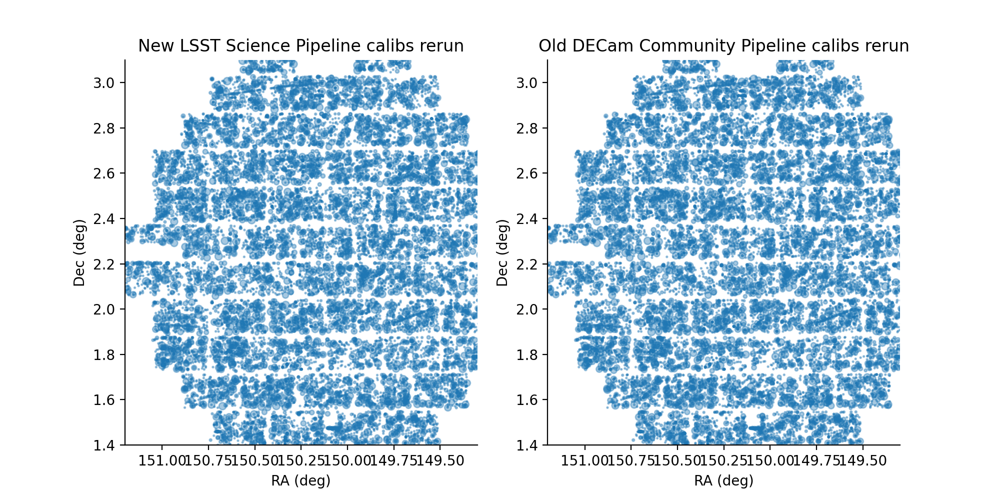

Text(0.5, 1.0, 'Old DECam Community Pipeline calibs rerun')

In [35]:
fig = plt.figure(figsize=(10,5))

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj['ra'], goodObj['decl'], c='C0', s=goodObj['nDiaSources'], marker='o', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title('New LSST Science Pipeline calibs rerun')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old['ra'], goodObj_old['decl'], c='C0', s=goodObj_old['nDiaSources'], marker='o', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title('Old DECam Community Pipeline calibs rerun')

In [36]:
print(len(goodObj.loc[goodObj['nDiaSources'] == 1]))

37370


In [37]:
print(len(goodObj_old.loc[goodObj_old['nDiaSources'] == 1]))

38543


In [49]:
print(len(goodObj.loc[goodObj['nDiaSources'] > 1]))

20425


In [50]:
print(len(goodObj_old.loc[goodObj_old['nDiaSources'] > 1]))

20808


In [48]:
diff_goodObj = len(goodObj_old) - len(goodObj)
diff_singleSrcGoodObj = (len(goodObj_old.loc[goodObj_old['nDiaSources'] == 1])) - (len(goodObj.loc[goodObj['nDiaSources'] == 1]))

print('Change in DIA Object count:', diff_goodObj)
print('Change in 1-source-only DIA Object count:', diff_singleSrcGoodObj)
print('Ratio:', diff_singleSrcGoodObj/diff_goodObj)

Change in DIA Object count: 1556
Change in 1-source-only DIA Object count: 1173
Ratio: 0.7538560411311054


## Some flag exploring, like in the notebook "Examine-Filtered-Sources"
The flag distribution hasn't changed much, but the spatial plot showing where all the flags are is pretty clean

In [52]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C5')
    psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               centroidflags[0],
               apfluxflags[0], 
               psffluxflags[0],
               ip_diffimflags[0],
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags',
               'Centroid flags',
               'ApFlux flags',
               'PsfFlux flags',
               'ip_diffim flags',
               'Shape flags'),
              frameon=False, loc='upper right', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


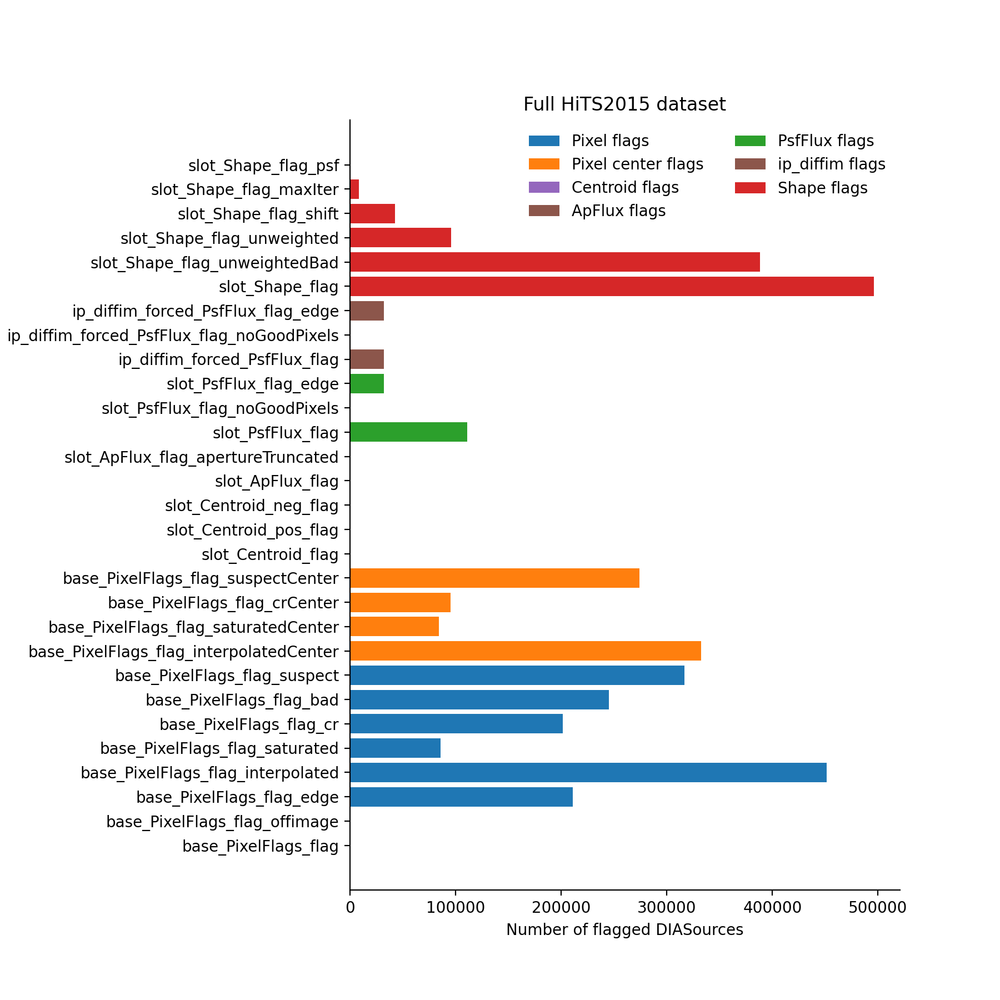

In [55]:
config = MapDiaSourceConfig()
unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
flag_values = unpacker.unpack(srcTable['flags'], 'flags')
flag_names = list(flag_values.dtype.names)
flagTable = pd.DataFrame(flag_values, index=srcTable.index)
flagSum = flagTable.sum()
plot_flag_hist([count for count in flagSum.values], flag_names, title='Full HiTS2015 dataset')

In [56]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=2, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=2, alpha=0.2, label=labelFalse)
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.invert_xaxis()
    
    ax.set_xlim(156.5, 155.5)
    ax.set_ylim(-5.85, -5.2)

In [59]:
srcTableFlags = pd.merge(srcTable, flagTable, left_index=True, right_index=True)

<IPython.core.display.Javascript object>


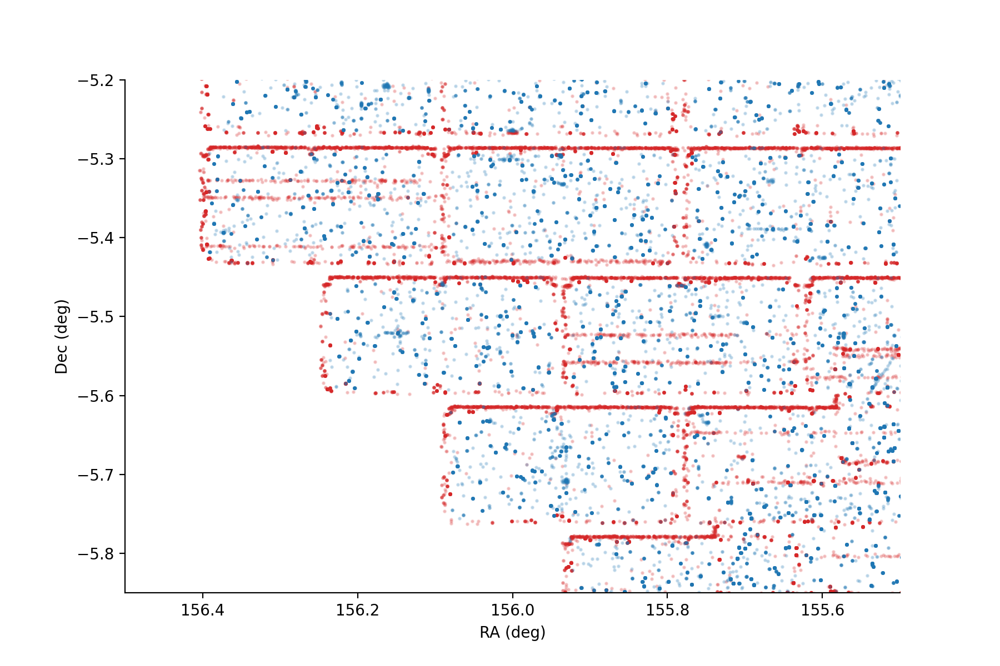

Flagged sources: 356993
Unflagged sources: 290025


In [61]:
spatial_flag_plot(srcTableFlags, 'base_PixelFlags_flag_bad', 'base_PixelFlags_flag_suspect', operator='or')

## Plotting a few nominally good light curves from the CI region for fun

In [62]:
miniDatasetGoodObj = ((goodObj['ra'] > 154.8) & (goodObj['ra'] < 155.3) &
                      (goodObj['decl'] > -6.02) & (goodObj['decl'] < -5.60))  # CI region plus nearby friends

In [63]:
flagFilter = ((srcTableFlags['base_PixelFlags_flag_bad']) | 
              (srcTableFlags['base_PixelFlags_flag_suspect']) |
              (srcTableFlags['base_PixelFlags_flag_saturatedCenter'])
             )

In [64]:
miniDatasetGoodSrc = ((~flagFilter) & (srcTableFlags['ra'] > 154.8) & (srcTableFlags['ra'] < 155.3) &
                      (srcTableFlags['decl'] > -6.02) & (srcTableFlags['decl'] < -5.60))

In [66]:
miniGoodObjDf = goodObj.loc[miniDatasetGoodObj]
miniGoodSrcDf = srcTableFlags.loc[miniDatasetGoodSrc]

In [67]:
print(len(miniGoodObjDf), len(miniGoodSrcDf))

1421 7558


In [68]:
miniGoodObjDfMult = miniGoodObjDf.loc[miniGoodObjDf['nDiaSources'] >= 20]

In [69]:
len(miniGoodObjDfMult)

149

In [89]:
#patchList = ['10,11', '10,12', '10,13', '10,14', '10,15', '11,10', '11,11', '11,12', '11,13', '11,14',
#             '11,15', '11,16', '11,6', '11,7', '11,8', '11,9', '12,10', '12,11', '12,12', '12,13', '12,14',
#             '12,15', '12,16', '12,5', '12,6', '12,7', '12,8', '12,9', '13,10', '13,11', '13,12', '13,13',
#             '13,14', '13,15', '13,16', '13,4', '13,5', '13,6', '13,7', '13,8', '13,9', '14,10', '14,11',
#             '14,12', '14,13', '14,14', '14,15', '14,16', '14,4', '14,5', '14,6', '14,7', '14,8', '14,9',
#             '15,10', '15,11', '15,12', '15,13', '15,14', '15,15', '15,16', '15,4', '15,5', '15,6', '15,7',
#             '15,8', '15,9']
patchList = ['14,10', '14,9', '15,10', '15,9']
dbPath = os.path.join(repo, 'association.db')

Loading APDB Sources...
DIAObject ID: 176493778289295610
RA (deg): [155.20392156]
Dec (deg): [-5.81491732]
Number of DIASources: 25


<IPython.core.display.Javascript object>


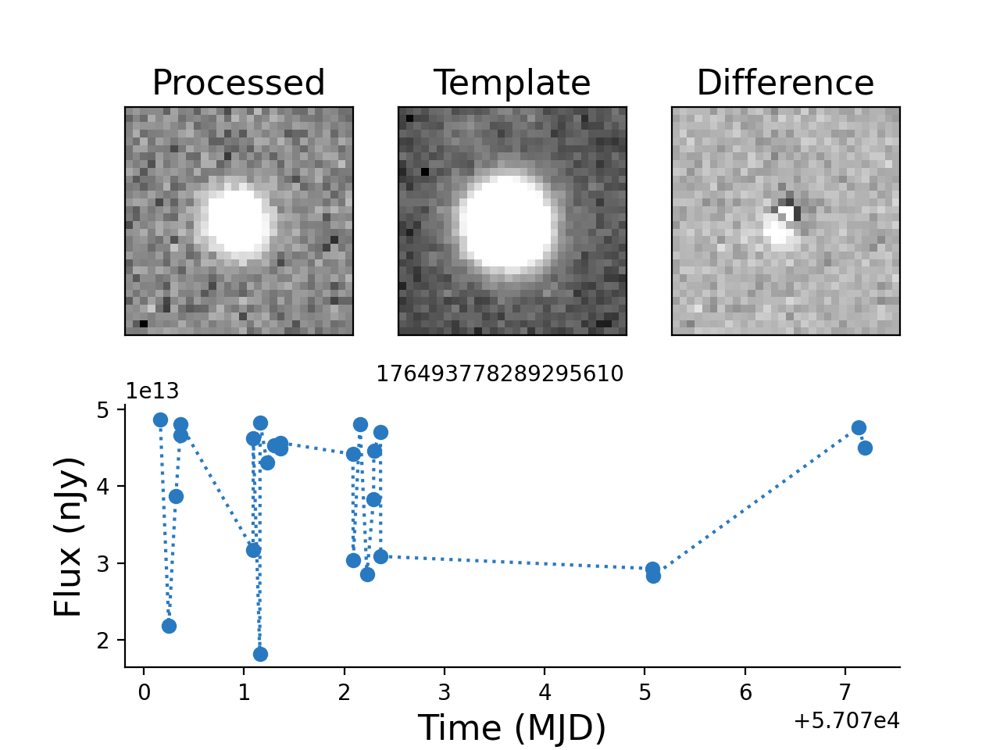

Template dataId {'tract': 0, 'patch': '14,10', 'filter': 'g'}


<IPython.core.display.Javascript object>


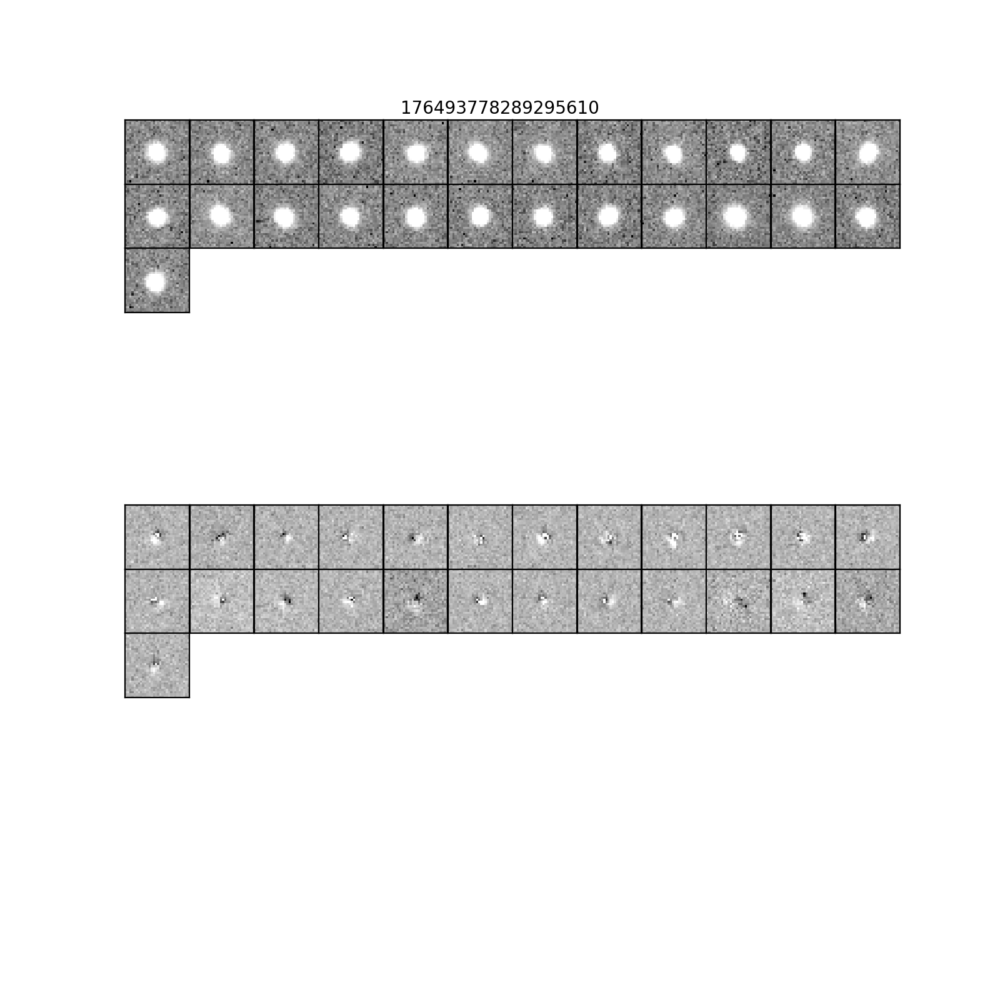

Loading APDB Sources...
DIAObject ID: 176492704547471597
RA (deg): [155.12039497]
Dec (deg): [-6.00703429]
Number of DIASources: 21


<IPython.core.display.Javascript object>


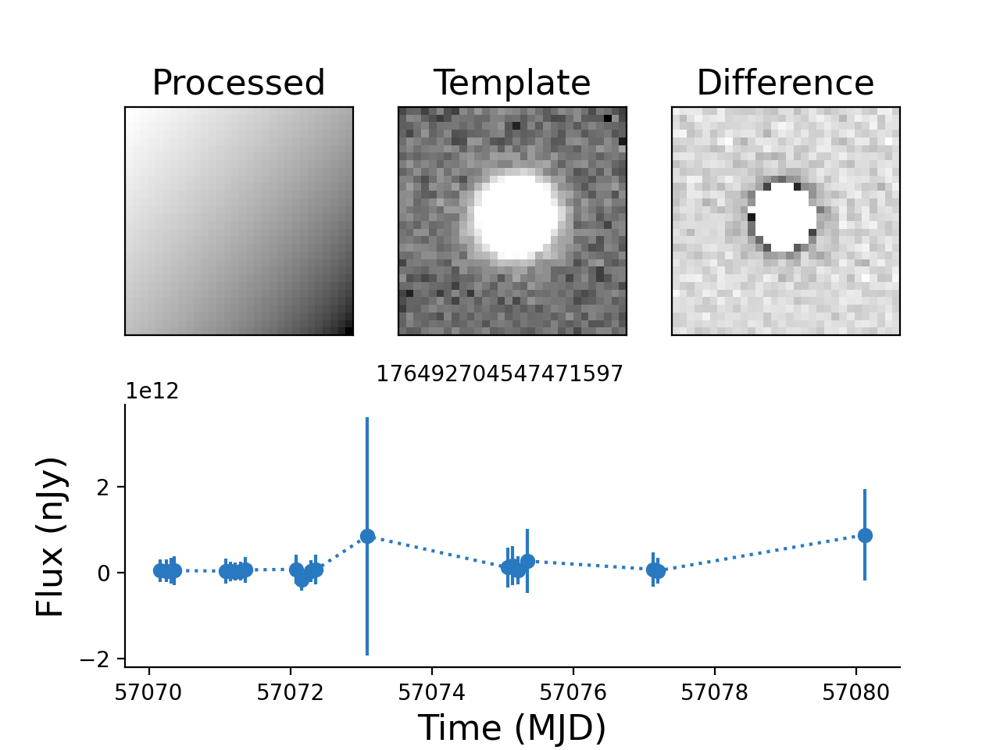

Template dataId {'tract': 0, 'patch': '14,9', 'filter': 'g'}


<IPython.core.display.Javascript object>


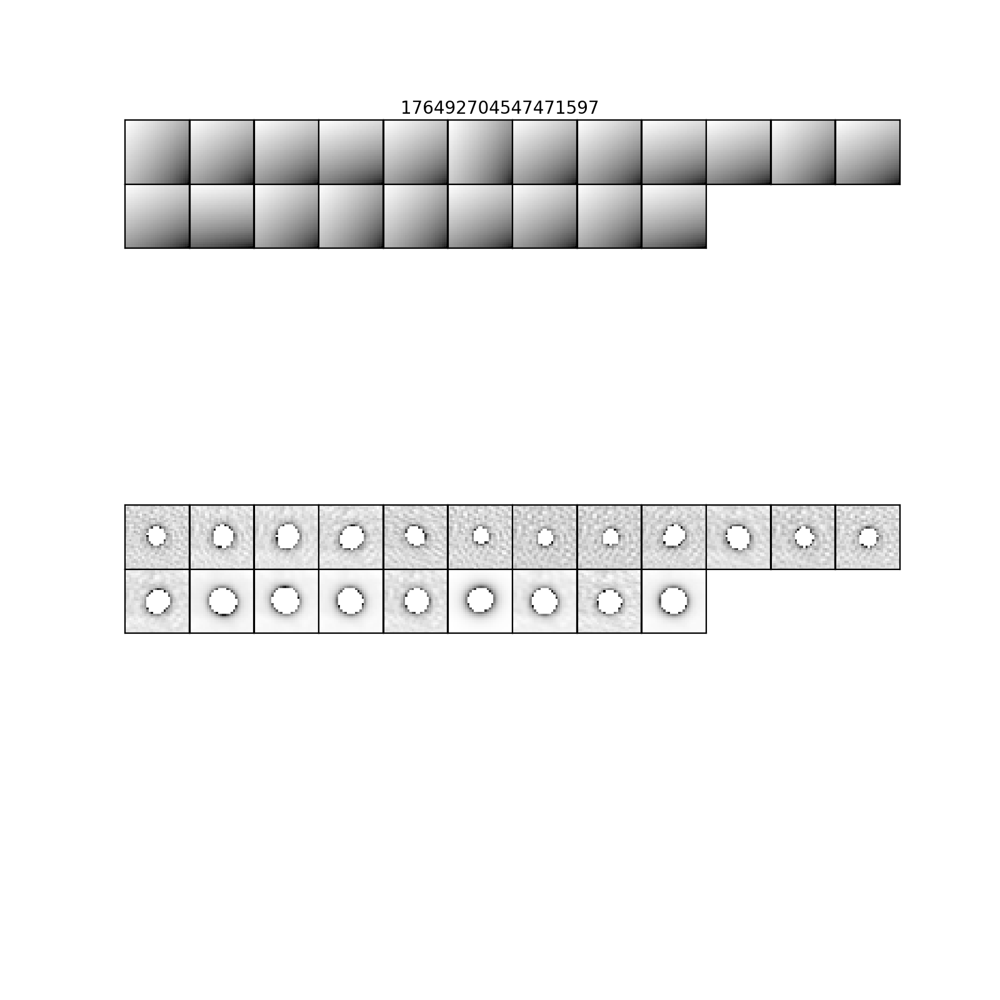

Loading APDB Sources...
DIAObject ID: 176492683072635110
RA (deg): [154.92870156]
Dec (deg): [-5.82522201]
Number of DIASources: 23


<IPython.core.display.Javascript object>


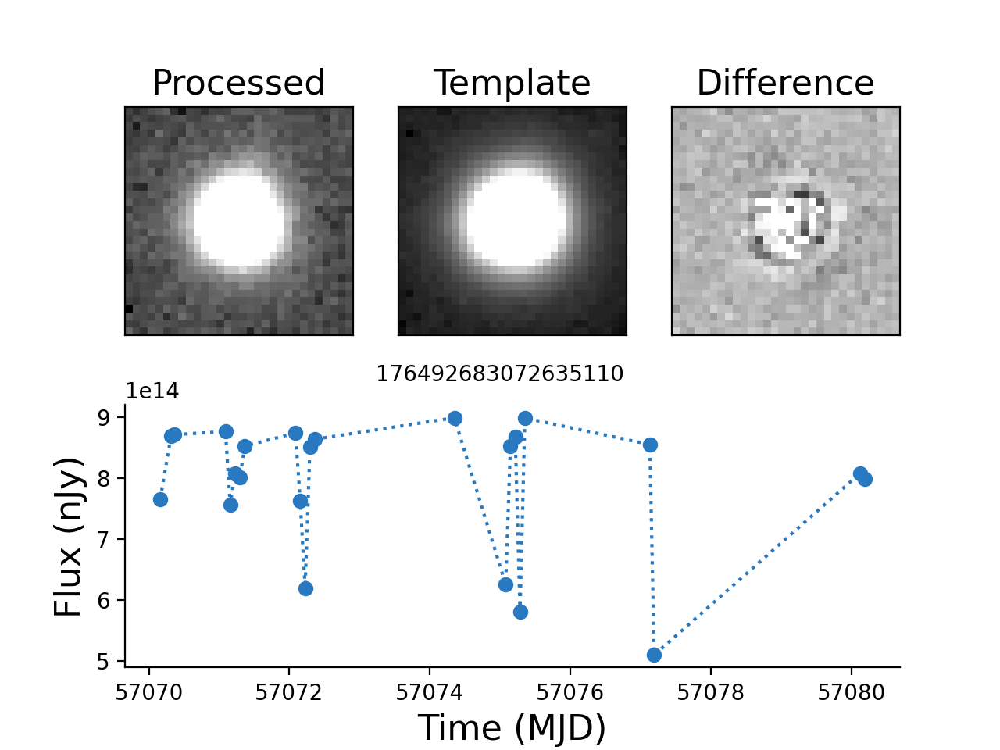

Template dataId {'tract': 0, 'patch': '15,10', 'filter': 'g'}


<IPython.core.display.Javascript object>


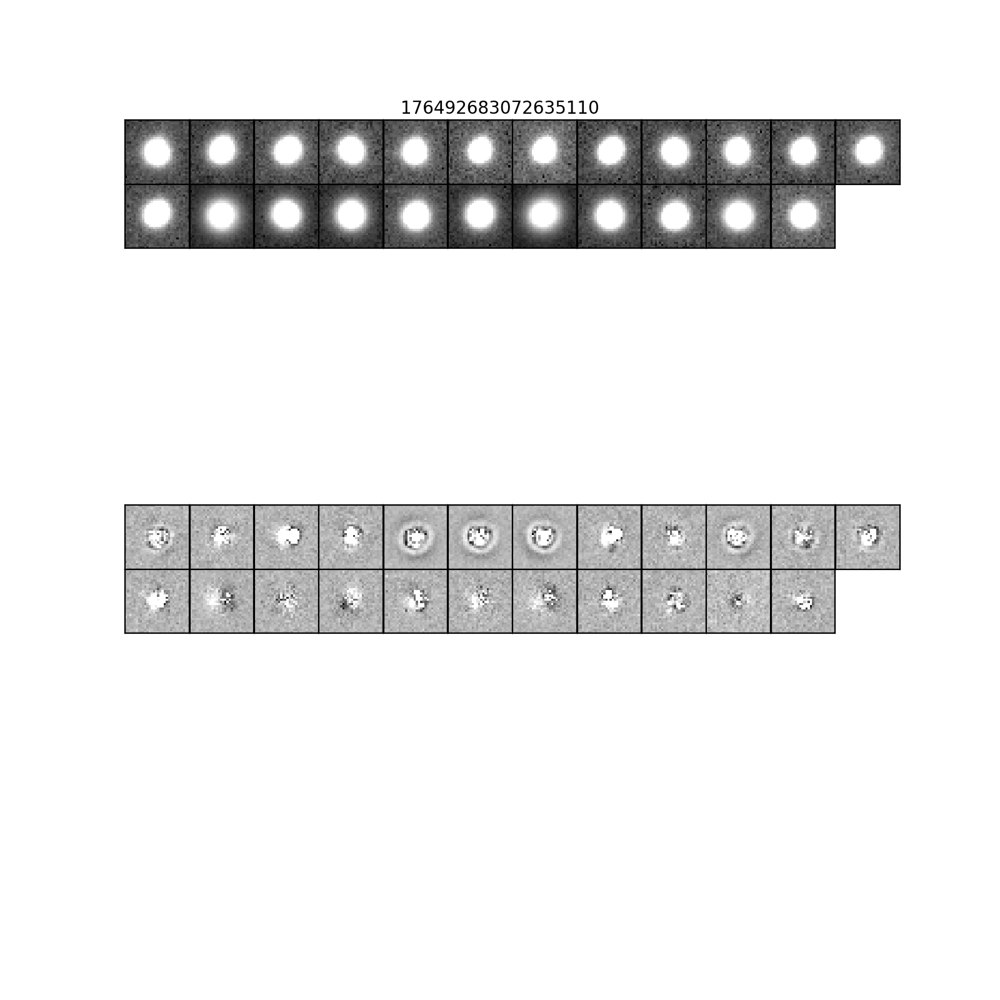

Loading APDB Sources...
DIAObject ID: 176516752069361971
RA (deg): [154.82024275]
Dec (deg): [-5.90263828]
Number of DIASources: 20


<IPython.core.display.Javascript object>


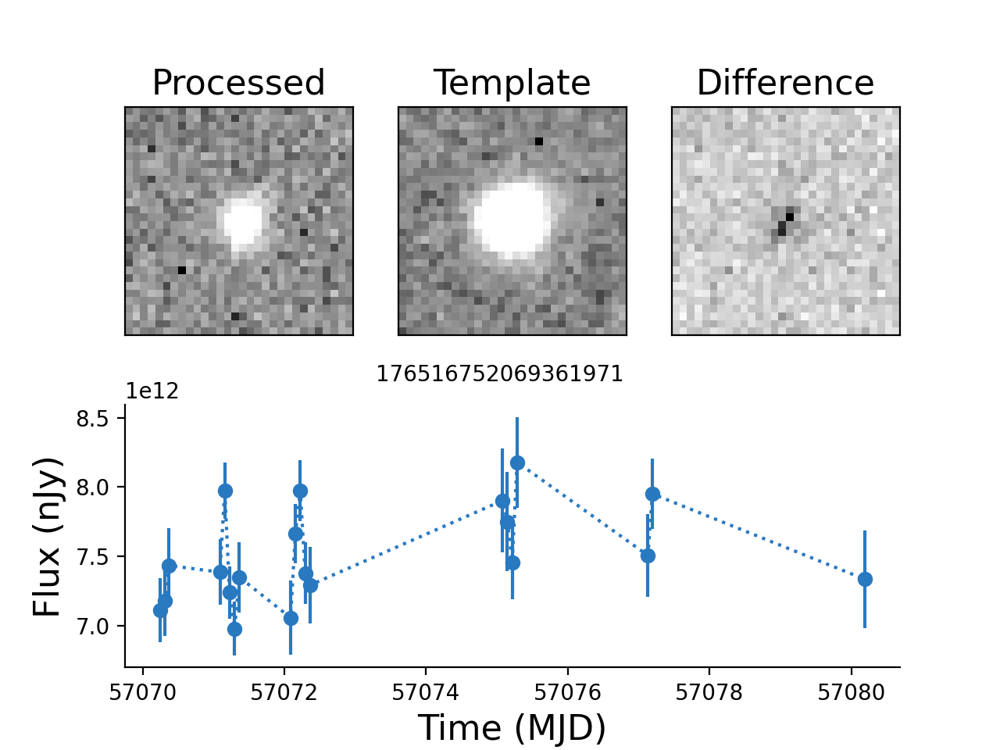

Template dataId {'tract': 0, 'patch': '15,9', 'filter': 'g'}


<IPython.core.display.Javascript object>


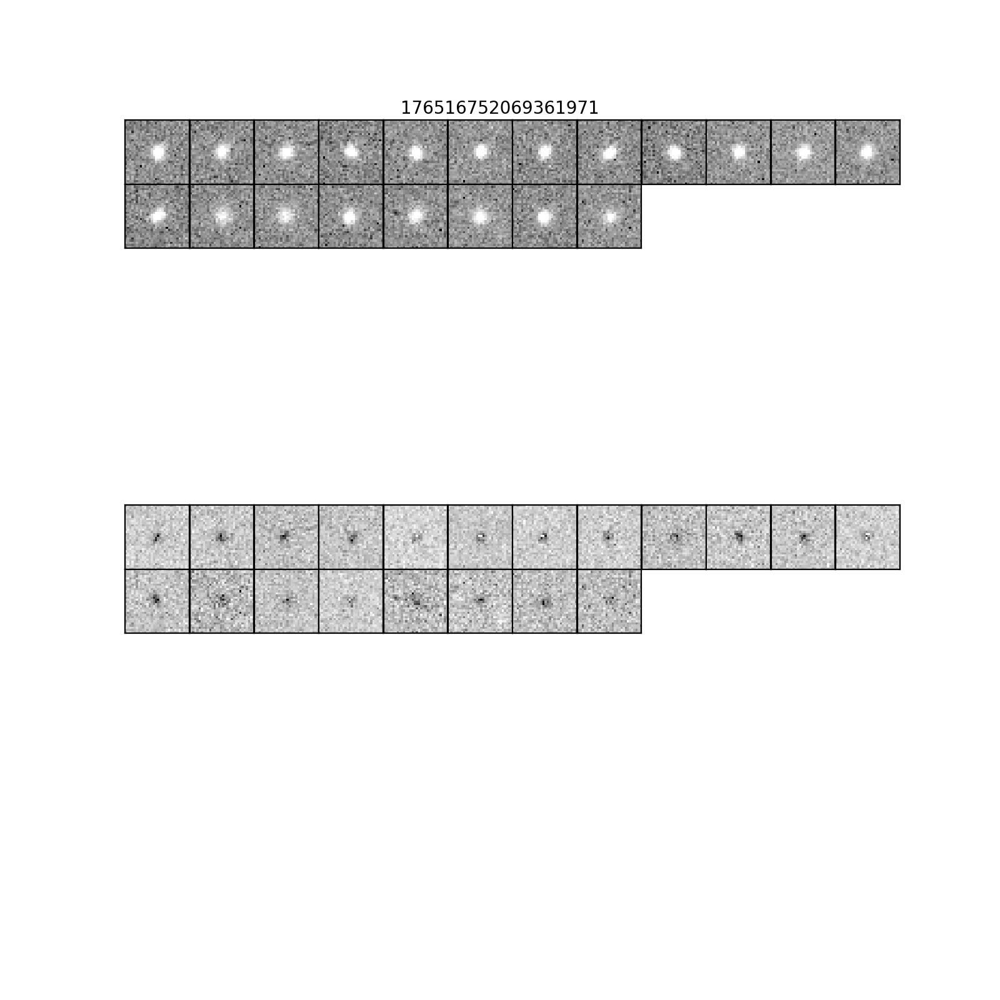

Loading APDB Sources...
DIAObject ID: 176492704547471622
RA (deg): [155.19727357]
Dec (deg): [-5.88600793]
Number of DIASources: 26


<IPython.core.display.Javascript object>


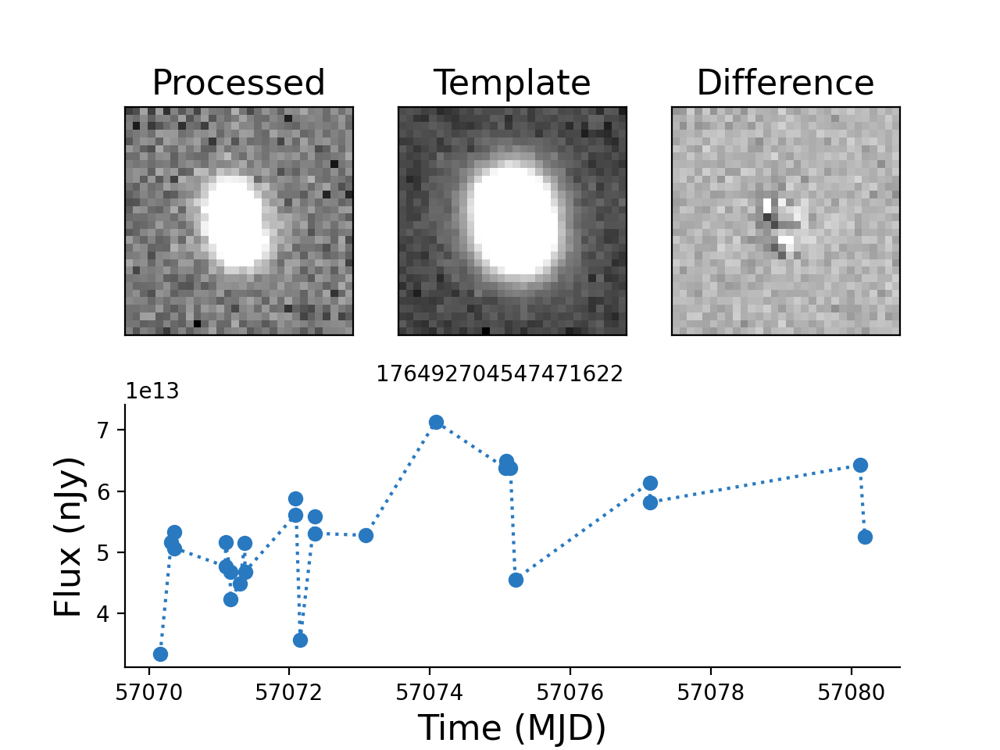

Template dataId {'tract': 0, 'patch': '14,10', 'filter': 'g'}


<IPython.core.display.Javascript object>


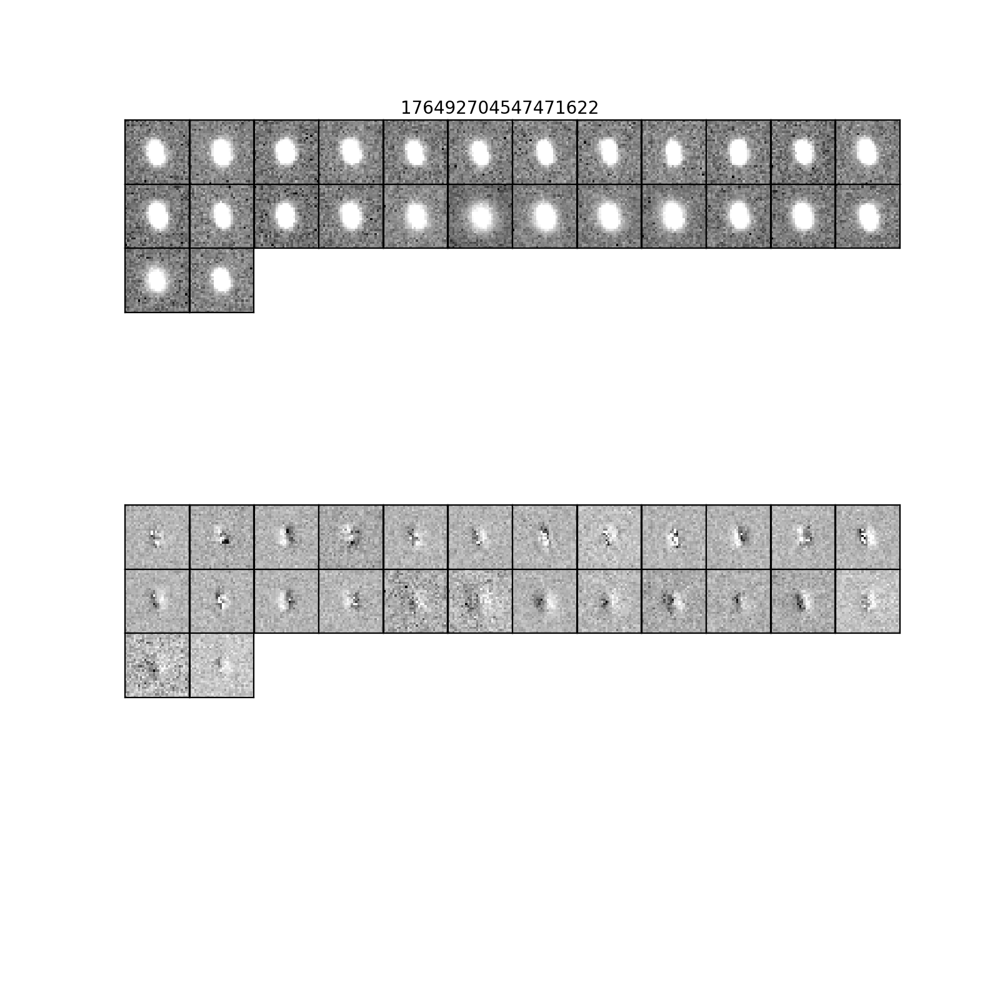

In [90]:
for obj in miniGoodObjDfMult['diaObjectId'].values[0:5]:
    plc.plotLightcurve(obj, miniGoodObjDf, repo, dbPath, repo, patchList, plotAllCutouts=True)